In [1]:
import einops
import torch
import pandas as pd
import numpy as np
import altair as alt
from torchvision import transforms
import matplotlib.pyplot as plt
from self_supervised.vision import simclr
from tqdm import tqdm
import torchinfo

from ophthalmology.data.sets import DiabeticRetinopythyDetection
from ophthalmology.models import resnet

%matplotlib inline

In [2]:
df = pd.read_csv("../../data/diabetic-retinopathy-detection/all_labels_cleaned.csv")

In [3]:
alt.data_transformers.disable_max_rows()

alt.Chart(df).mark_bar().encode(
    alt.X("level:N"),
    y='count()',
).properties(
    width=600,
    height=400,
    title="class distribution"
)

alt.Chart(...)

In [4]:
# class distributions of the individual sets
counts = lambda df: list(map(lambda x: x/len(df), list(df.groupby("level").count()['image'])))

In [5]:
print(f"all: {counts(df)}")

df = pd.read_csv("../../data/diabetic-retinopathy-detection/train_labels_cleaned.csv")
print(f"train: {counts(df)}")

df = pd.read_csv("../../data/diabetic-retinopathy-detection/test_labels_cleaned.csv")
print(f"test: {counts(df)}")

all: [0.7366533999300959, 0.06996042528722672, 0.14827551215992243, 0.02353060557202936, 0.021580057050725538]
train: [0.7347682496298827, 0.06955358159662908, 0.15066621113768364, 0.024854800136658695, 0.020157157499145883]
test: [0.7378894509884448, 0.07022718363232466, 0.146707984095279, 0.02266236069368478, 0.022513020590266757]


In [8]:
p = counts(df)
w = [0.2/p for p in p]
print(p)
print(w)

[0.7378894509884448, 0.07022718363232466, 0.146707984095279, 0.02266236069368478, 0.022513020590266757]
[0.2710433110706335, 2.8479000531632113, 1.3632523221783943, 8.82520593080725, 8.88374792703151]


In [5]:
data = DiabeticRetinopythyDetection(
    image_dir="../../data/diabetic-retinopathy-detection/images",
    csv_file="../../data/diabetic-retinopathy-detection/all_labels.csv",
    transform=None
)

In [6]:
len(data)

88701

In [7]:
image, level = data[1]

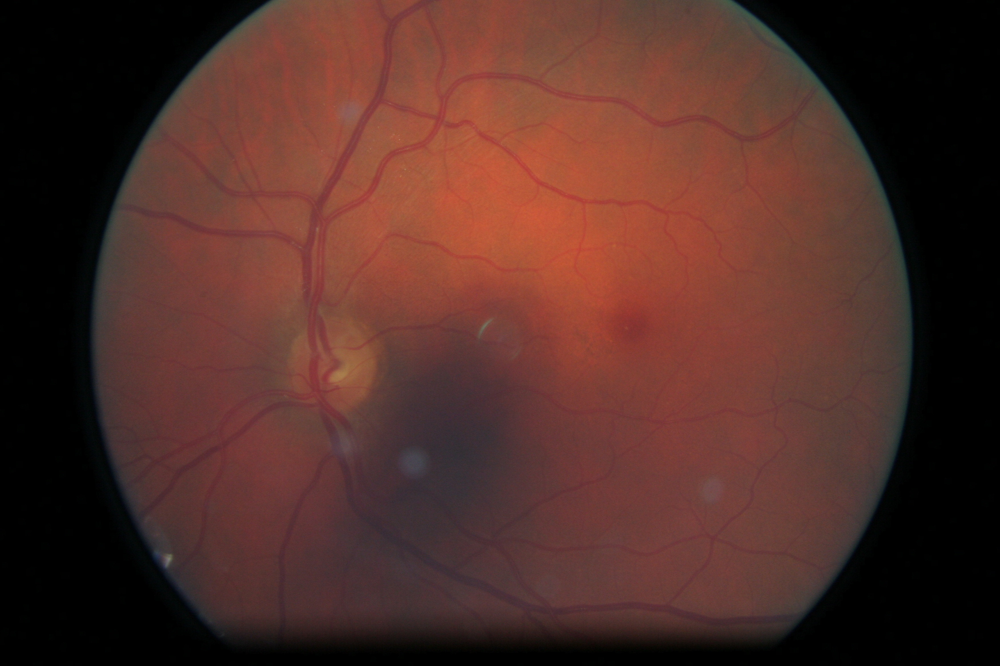

In [8]:
image

In [9]:
data = DiabeticRetinopythyDetection(
    image_dir="../../data/diabetic-retinopathy-detection/images",
    csv_file="../../data/diabetic-retinopathy-detection/all_labels.csv",
    transform=transforms.Compose([
            transforms.ToTensor(),
    ])
)

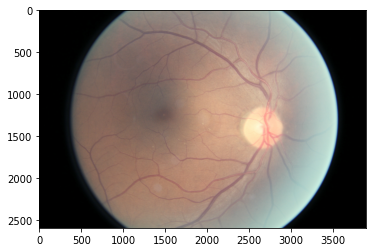

In [10]:
plt.imshow(einops.rearrange(data[46][0].squeeze(), "c w h -> w h c"))

In [11]:
aug_pipelines = transforms.Compose(simclr.get_simclr_aug_pipelines(size=128))

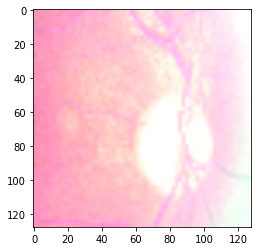

In [12]:
plt.imshow(einops.rearrange(aug_pipelines(data[46][0]).squeeze(), "c w h -> w h c"))

In [13]:
def plot_augmentation(dataset, idx, transform, transform_pre):
    fig = plt.figure(figsize=(12, 3))
    
    plt.subplot(1, 4, 1)
    plt.title("original image")
    c = plt.imshow(einops.rearrange(transform_pre(dataset[idx][0]).squeeze(), "c w h -> w h c"), interpolation='nearest')
    plt.axis("off")
    plt.subplot(1, 4, 2)
    c = plt.imshow(einops.rearrange(transform(dataset[idx][0]).squeeze(), "c w h -> w h c"), interpolation='nearest')
    plt.axis("off")
    plt.subplot(1, 4, 3)
    c = plt.imshow(einops.rearrange(transform(dataset[idx][0]).squeeze(), "c w h -> w h c"), interpolation='nearest')
    plt.axis("off")
    plt.subplot(1, 4, 4)
    c = plt.imshow(einops.rearrange(transform(dataset[idx][0]).squeeze(), "c w h -> w h c"), interpolation='nearest')
    plt.axis("off")
    plt.tight_layout(pad=0.5)

    return fig

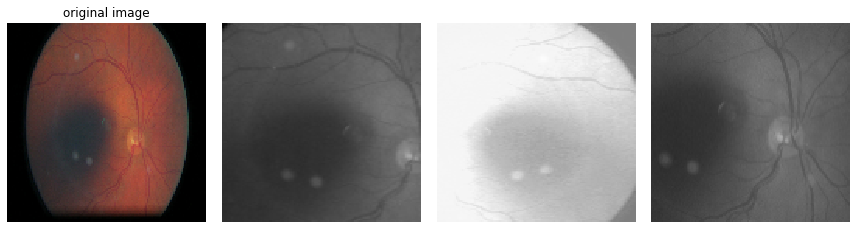

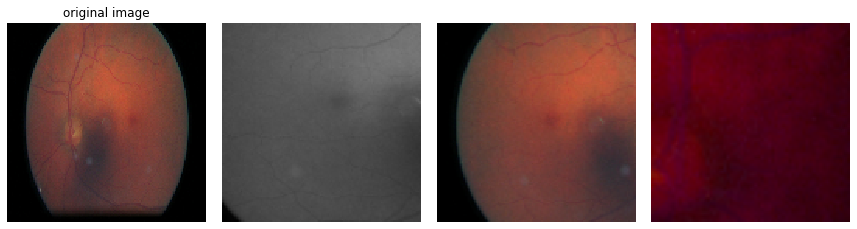

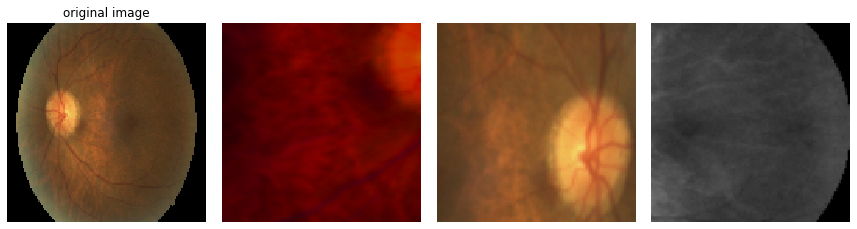

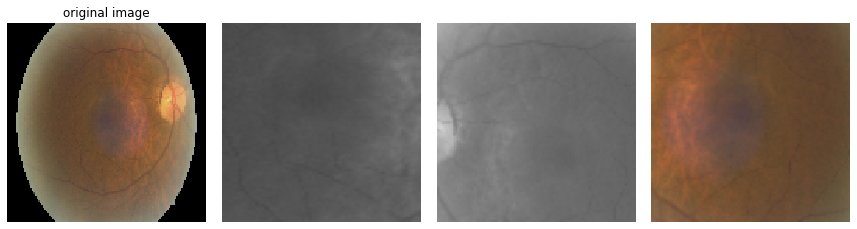

In [14]:
for i in range(4):
    plot_augmentation(data, i, aug_pipelines, transforms.Resize((128,128)));

## Dataset channel statisitcs
means: [0.3211, 0.2243, 0.1602]
stds: [0.2617, 0.1825, 0.1308]

In [15]:
data = DiabeticRetinopythyDetection(
    image_dir="../../data/diabetic-retinopathy-detection/images",
    csv_file="../../data/diabetic-retinopathy-detection/all_labels.csv",
    transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Compose(
                simclr.get_simclr_aug_pipelines(
                    size=256,
                    stats=([0.3211, 0.2243, 0.1602],[0.2617, 0.1825, 0.1308])
                )
            ),
    ])
)

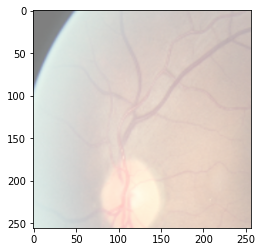

In [23]:
img = lambda image : einops.rearrange(torch.clamp((image/2)+0.5, 0.0, 1.0), "b c w h -> b w h c")
#img = lambda image : einops.rearrange((image - torch.min(image)) / (torch.max(image) - torch.min(image)), "b c w h -> b w h c")

image = data[46][0]
plt.imshow(img(image).squeeze())

## Resnet model tests

In [15]:
model = resnet.ResNetBackbone("resnet50", pretrained=True)

torchinfo.summary(
    model, input_size=(8, 3, 256, 256), device="cpu"
)

Layer (type:depth-idx)                        Output Shape              Param #
ResNetBackbone                                --                        --
├─ResNet: 1-1                                 [8, 2048]                 --
│    └─Conv2d: 2-1                            [8, 64, 128, 128]         9,408
│    └─BatchNorm2d: 2-2                       [8, 64, 128, 128]         128
│    └─ReLU: 2-3                              [8, 64, 128, 128]         --
│    └─MaxPool2d: 2-4                         [8, 64, 64, 64]           --
│    └─Sequential: 2-5                        [8, 256, 64, 64]          --
│    │    └─Bottleneck: 3-1                   [8, 256, 64, 64]          75,008
│    │    └─Bottleneck: 3-2                   [8, 256, 64, 64]          70,400
│    │    └─Bottleneck: 3-3                   [8, 256, 64, 64]          70,400
│    └─Sequential: 2-6                        [8, 512, 32, 32]          --
│    │    └─Bottleneck: 3-4                   [8, 512, 32, 32]          379,392

In [12]:
model.encoder.maxpool.stride=1

torchinfo.summary(
    model, input_size=(8, 3, 128, 128), device="cpu"
)

Layer (type:depth-idx)                        Output Shape              Param #
ResNetBackbone                                --                        --
├─ResNet: 1-1                                 [8, 2048]                 --
│    └─Conv2d: 2-1                            [8, 64, 64, 64]           9,408
│    └─BatchNorm2d: 2-2                       [8, 64, 64, 64]           128
│    └─ReLU: 2-3                              [8, 64, 64, 64]           --
│    └─MaxPool2d: 2-4                         [8, 64, 64, 64]           --
│    └─Sequential: 2-5                        [8, 256, 64, 64]          --
│    │    └─Bottleneck: 3-1                   [8, 256, 64, 64]          75,008
│    │    └─Bottleneck: 3-2                   [8, 256, 64, 64]          70,400
│    │    └─Bottleneck: 3-3                   [8, 256, 64, 64]          70,400
│    └─Sequential: 2-6                        [8, 512, 32, 32]          --
│    │    └─Bottleneck: 3-4                   [8, 512, 32, 32]          379,392